In [1]:
import sys 
import os 
import numpy as np
import torch

sys.path.append('../')

In [2]:
from src.utils.quantizer import Normalizer
from src.linear_compress import LinearQuantizedSparse

/home/lliu/anaconda3/lib/python3.11/site-packages/torch/jit/annotations.py:389: UserWarning: TorchScript will treat type annotations of Tensor dtype-specific subtypes as if they are normal Tensors. dtype constraints are not enforced in compilation either.
  warnings.warn(


In [3]:
# linear_layer = "layer_1/mlp.up_proj"
linear_layer = "layer_0/self_attn.q_proj"
weight = f"/data/lliu/huffman/models/meta-llama/Llama-2-7b-hf/original_weights/{linear_layer}.pt"
hessian = f"/data/lliu/huffman/models/meta-llama/Llama-2-7b-hf/hessians_new/seed_0/pajama/128/{linear_layer}.pt"


weight = torch.load(weight, map_location='cpu')["weight"].detach()
_,weight_normalized = Normalizer.normalize_init(weight, [0,1], [False,False])
hessian = torch.load(hessian, map_location='cpu')["hessian"]
d_out, d_in = weight.shape

/tmp/ipykernel_1582762/2490378629.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  weight = torch.load(weight, map_location='cpu')["weight"].detach()
/tmp/ipykernel_15827

In [4]:
method_name = "WANC-P"

In [5]:
sparse_mask = {}

with torch.no_grad():
    patterns = [None, (4,8), (2,4)]
    pattern_names = ["50%", "4:8", "2:4"]
    for i,pattern in enumerate(patterns):

        sparse_mask[pattern_names[i]] = {}

        if pattern is None:
            wanda_sparse_no_group = LinearQuantizedSparse(weight)
            wanda_sparse_no_group.hessian = hessian.clone()
            wanda_sparse_no_group.sparse_only(["wanda"], 0.5, sparse_after_norm=False, pattern=None)
            sparse_mask[pattern_names[i]]["wanda"] = wanda_sparse_no_group.sparse_modules[0].sparse_mask.clone()

            wanda_sparse_group = LinearQuantizedSparse(weight)
            wanda_sparse_group.hessian = hessian.clone()
            wanda_sparse_group.sparse_only(["wanda"], 0.5, sparse_after_norm=False, pattern=pattern, group=d_in)
            sparse_mask[pattern_names[i]]["wanda_group"] = wanda_sparse_group.sparse_modules[0].sparse_mask.clone()
        else:
            wanda_sparse = LinearQuantizedSparse(weight)
            wanda_sparse.hessian = hessian.clone()  
            wanda_sparse.sparse_only(["wanda"], 0.5, sparse_after_norm=False, pattern=pattern)
            sparse_mask[pattern_names[i]]["wanda"] = wanda_sparse.sparse_modules[0].sparse_mask.clone()

        our_sparse = LinearQuantizedSparse(weight)
        our_sparse.hessian = hessian.clone()
        our_sparse.sparse_only(["wanda"], 0.5, sparse_after_norm=True, norm_order = [0,1], zero = [False,False], pattern=pattern)
        sparse_mask[pattern_names[i]][method_name] = our_sparse.sparse_modules[0].sparse_mask.clone()


In [7]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable

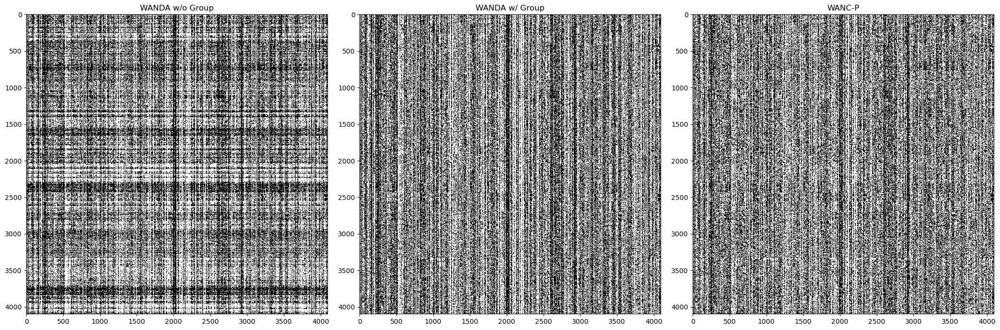

In [19]:
figsize = 7
fig,axs = plt.subplots(1,3,figsize=(figsize*3,figsize))

masks_unstructured = sparse_mask["50%"]

titles = ["WANDA w/o Group", "WANDA w/ Group", method_name]
for i,compression_name in enumerate(masks_unstructured.keys()):
    ax = axs[i]
    ax.imshow(masks_unstructured[compression_name].cpu().numpy(), cmap="Greys", aspect="auto",interpolation='nearest')
    ax.set_title(titles[i])
    #turn off axis
    # ax.axis('off')
#tight layout
plt.tight_layout()
plt.savefig(f"{linear_layer.replace('/','-')}_unstructured.png")

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

abs_weights = torch.abs(weight.detach())

#get the 99th percentile of the weights
threshold = np.percentile(abs_weights.numpy().flatten(), 99)

norm = mcolors.Normalize(vmin=0, vmax=threshold)

fig,axs = plt.subplots(1,2, figsize=(20,10), tight_layout=True)

ax1,ax2 = axs
im1 = axs[0].imshow(abs_weights, interpolation='nearest', norm=norm, cmap='viridis')
axs[0].set_title("Absolute Value of Weights")
#add a colorbar
divider = make_axes_locatable(ax1)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im1, cax=cax, orientation='vertical')

abs_normalized = torch.abs(weight_normalized)
threshold = np.percentile(abs_normalized.numpy().flatten(), 99)
norm = mcolors.Normalize(vmin=0, vmax=threshold)
im2 = axs[1].imshow(torch.abs(weight_normalized), interpolation='nearest', cmap='viridis', norm=norm)
axs[1].set_title("Absolute Value of WANC Normalized Weights")
# axs[1].axis('off')  

divider = make_axes_locatable(ax2)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im2, cax=cax, orientation='vertical')

plt.savefig(f"{linear_layer.replace('/','-')}_weights.png")
plt.show()

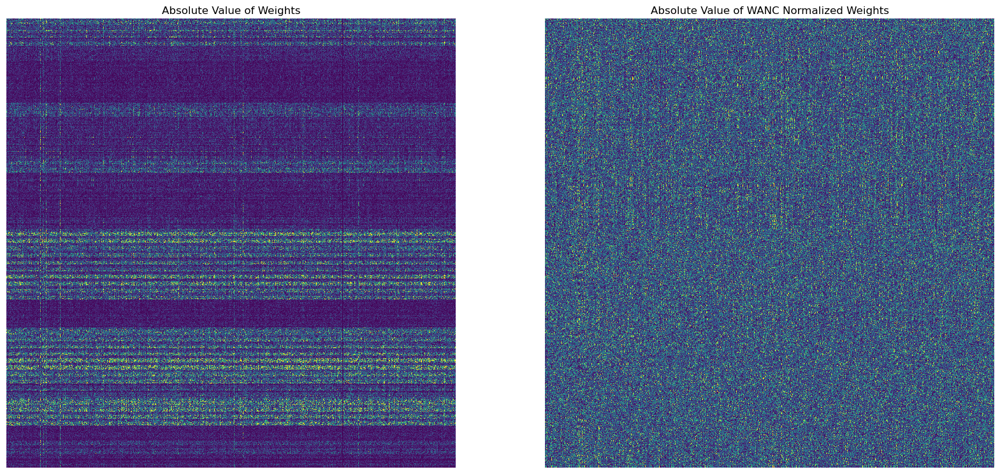

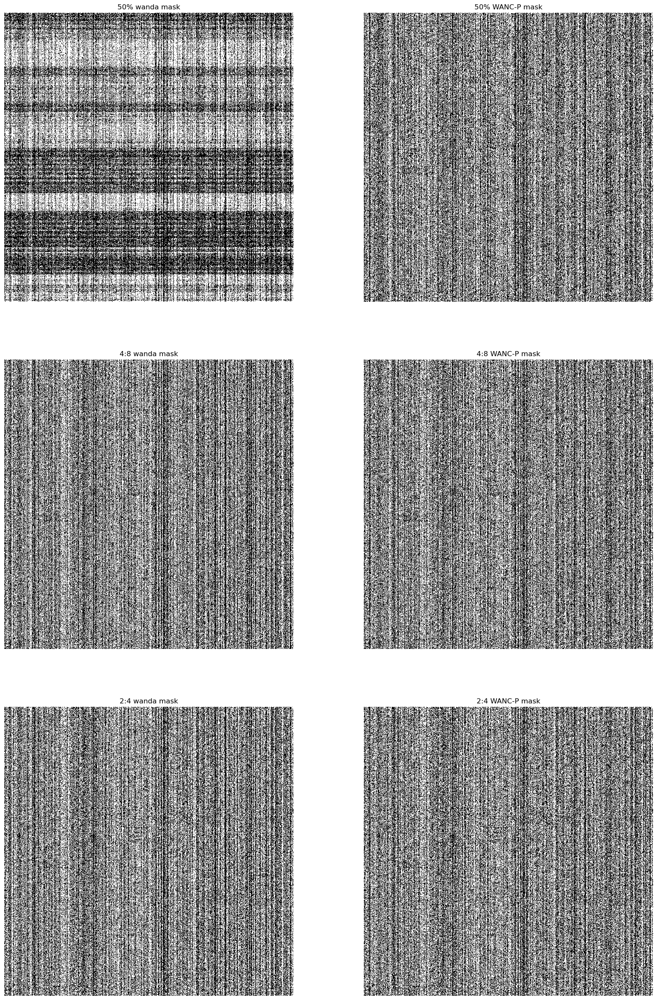

In [18]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

abs_weights = torch.abs(weight.detach())

#get the 99th percentile of the weights
threshold = np.percentile(abs_weights.numpy().flatten(), 99)

norm = mcolors.Normalize(vmin=0, vmax=threshold)

fig,axs = plt.subplots(1,2, figsize=(20,10))
axs[0].imshow(abs_weights, interpolation='nearest', norm=norm, cmap='viridis')
axs[0].set_title("Absolute Value of Weights")
axs[0].axis('off')

abs_normalized = torch.abs(weight_normalized)
threshold = np.percentile(abs_normalized.numpy().flatten(), 99)
norm = mcolors.Normalize(vmin=0, vmax=threshold)
axs[1].imshow(torch.abs(weight_normalized), interpolation='nearest', cmap='viridis', norm=norm)
axs[1].set_title("Absolute Value of WANC Normalized Weights")
axs[1].axis('off')  
plt.savefig(f"{linear_layer.replace('/','-')}_weights.png")
plt.show()


fig,axs = plt.subplots(len(patterns),2, figsize=(20,len(patterns)*10))


for i,pattern in enumerate(patterns):
    for j,method in enumerate(["wanda", method_name]):
        ax = axs[i,j]
        ax.imshow(sparse_mask[pattern_names[i]][method], interpolation='nearest', cmap='Greys')
        ax.set_title(f"{pattern_names[i]} {method} mask")
        ax.axis('off')

# plt.tight_layout()
plt.savefig(f"{linear_layer.replace('/','-')}_sparse_mask.png")

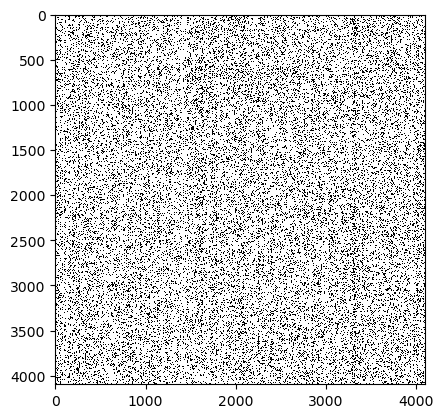

In [17]:
plt.imshow(sparse_mask["50%"][method_name] != sparse_mask["2:4"][method_name], interpolation='nearest', cmap='Greys')

In [46]:
torch.all(sparse_mask["2:4"][method_name] == sparse_mask["50%"][method_name])

tensor(False)

In [ ]:
torch.all(sparse_mask["2:4"]["wanda"].reshape(-1,4).sum(1)==2)

tensor(False)

In [117]:
with torch.no_grad():
    importances_non_normalized = torch.abs(weight) * hessianDiag.unsqueeze(0)

    frac_sparse = 0.5

    #sort the importances
    sorted_indices = torch.argsort(importances_non_normalized.flatten(), descending=True)
    idx1, idx2 = sorted_indices // d_in, sorted_indices % d_in
    mask_non_normalized = torch.zeros_like(importances_non_normalized).bool()

    mask_non_normalized[idx1[:int(frac_sparse * d_out * d_in)], idx2[:int(frac_sparse * d_out * d_in)]] = True

    _,weight_normalized = Normalizer.normalize_init(weight, [0,1], [False,False])
    importances_normalized = torch.abs(weight_normalized) * hessianDiag.unsqueeze(0)

    sorted_indices = torch.argsort(importances_normalized.flatten(), descending=True)
    idx1, idx2 = sorted_indices // d_in, sorted_indices % d_in
    mask_normalized = torch.zeros_like(importances_normalized).bool()

    mask_normalized[idx1[:int(frac_sparse * d_out * d_in)], idx2[:int(frac_sparse * d_out * d_in)]] = True


In [118]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

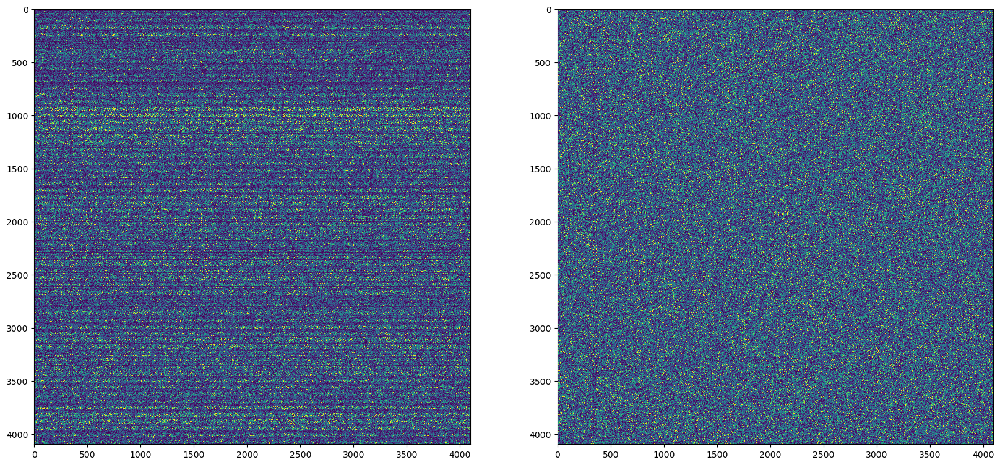

In [ ]:
abs_weights = torch.abs(weight.detach())

#get the 99th percentile of the weights
threshold = np.percentile(abs_weights.numpy().flatten(), 99)

norm = mcolors.Normalize(vmin=0, vmax=threshold)

fig,axs = plt.subplots(1,2, figsize=(20,10))
axs[0].imshow(abs_weights, interpolation='nearest', norm=norm, cmap='viridis')

abs_normalized = torch.abs(weight_normalized)
threshold = np.percentile(abs_normalized.numpy().flatten(), 99)
norm = mcolors.Normalize(vmin=0, vmax=threshold)
axs[1].imshow(torch.abs(weight_normalized), interpolation='nearest', cmap='viridis', norm=norm)
# plt.imshow(torch.abs(weight.detach()), interpolation='nearest', norm=norm, cmap='viridis')

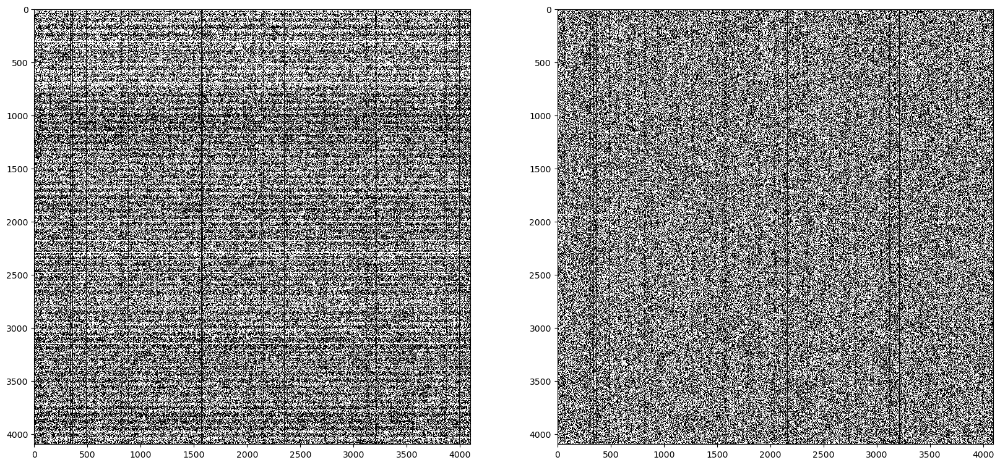

In [ ]:
fig,axs = plt.subplots(1,2, figsize=(20,10))
plt.sca(axs[0])
plt.imshow(mask_non_normalized, cmap="Greys", aspect="equal", interpolation="nearest")
plt.sca(axs[1])
plt.imshow(mask_normalized, cmap="Greys", aspect="equal", interpolation="nearest")